In [1]:
%load_ext autoreload
%autoreload 2

import pylogics.parsers.ldl
from mdp_dp_rl.algorithms.dp.dp_analytic import DPAnalytic

from stochastic_service_composition.declare_utils import *
from stochastic_service_composition.composition_mdp import composition_mdp
from stochastic_service_composition.composition_mdp import comp_mdp
from stochastic_service_composition.dfa_target import mdp_from_dfa
from stochastic_service_composition.services import build_service_from_transitions, Service
from stochastic_service_composition.target import build_target_from_transitions
from stochastic_service_composition.dfa_target import from_symbolic_automaton_to_declare_automaton

from src.chip.utils import *
import logaut

In [2]:
def target_service_ltlf(declare_constraints, all_symbols_set):
    '''Builds the target service LTLf formula from the DECLARE constraints and symbols.'''
    formula_str = " & ".join(map(lambda s: f"({s})", declare_constraints))
    formula = pylogics.parsers.parse_ltl(formula_str)
    automaton = logaut.core.ltl2dfa(formula, backend="lydia")
    declare_automaton = from_symbolic_automaton_to_declare_automaton(automaton, all_symbols_set)
    return declare_automaton

In [3]:
def build_generic_service_one_state(
    service_name: str,
    operation_names: Set[str],
    action_reward: float,
) -> Service:
    '''1-state service: ready'''
    transitions = {
        "re": {
            operation_name: ({"re": 1.0}, action_reward) for operation_name in operation_names
        },
    }
    final_states = {"re"}
    initial_state = "re"
    return build_service_from_transitions(transitions, initial_state, final_states)  # type: ignore


def build_generic_breakable_service(service_name: str, action_name: str, broken_prob: float, broken_reward: float, action_reward: float):
    '''3-states service: available, broken, done'''
    assert 0.0 <= broken_prob <= 1.0
    deterministic_prob = 1.0
    success_prob = deterministic_prob - broken_prob
    transitions = {
        "av": {
            action_name: ({"do": success_prob, "br": broken_prob}, action_reward),
        },
        "br": {
            f"ch_{action_name}": ({"av": 1.0}, broken_reward),
        },
        "do": {
            f"ch_{action_name}": ({"av": 1.0}, 0.0),
        }
    }
    final_states = {"av"}
    initial_state = "av"
    return build_service_from_transitions(transitions, initial_state, final_states)  # type: ignore


def build_complex_breakable_service(service_name: str, action_name: str, broken_prob: float, unemployable_prob: float, broken_reward: float, action_reward: float) -> Service:
    '''5-states service: ready, configured, executing, broken, repaired'''
    assert 0.0 <= broken_prob <= 1.0
    deterministic_prob = 1.0
    configure_success_prob = deterministic_prob - unemployable_prob
    op_success_prob = deterministic_prob - broken_prob
    transitions = {
        "re": { # current state
            f"con_{action_name}": # action
                (
                    {
                        "con": deterministic_prob # next state : prob
                    },
                    0.0
                ),
        },
        "con": {
            f"che_{action_name}":
                (
                    {
                    "ex": configure_success_prob,
                    "br": unemployable_prob
                    } if unemployable_prob > 0.0 else {"ex": configure_success_prob},
                    0.0
                ),
        },
        "ex": {
            action_name: # operation
                (
                    {
                        "re": op_success_prob,
                        "br": broken_prob
                    } if broken_prob > 0.0 else {"re": op_success_prob},
                    action_reward
                ),
        },
        "br": {
            f"res_{action_name}":
                (
                    {
                        "rep": deterministic_prob
                    },
                    broken_reward
                ),
        },
        "rep": {
            f"rep_{action_name}":
                (
                    {
                        "re": deterministic_prob
                    },
                    0.0
                ),
        },

    }
    final_states = {"re"}
    initial_state = "re"
    return build_service_from_transitions(transitions, initial_state, final_states)  # type: ignore

## Services properties

In [4]:
LOW_PROB = 0.05

# probabilities of being broken after an action
DEFAULT_BROKEN_PROB = LOW_PROB
BROKEN_PROB = 0.5
HIGH_BROKEN_PROB = 0.7

# default probability of being unemployable after the configuration
DEFAULT_UNEMPLOYABLE_PROB = LOW_PROB
HIGH_UNEMPLOYABLE_PROB = 0.5

# costs of the machines that perform their job in different countries
DEFAULT_USA_REWARD = -1.0
USA_REWARD = -2.0
HIGH_USA_REWARD = -5.0
UK_REWARD = -6.8
CHINA_REWARD = -11.7
TAIWAN_REWARD = -12.2
RUSSIA_REWARD = -9.12 
NORWAY_REWARD = -7.16
BRAZIL_REWARD = -6.7
FRANCE_REWARD = -7.6
AUSTRALIA_REWARD = -14.0
INDIA_REWARD = -13.1
BELGIUM_REWARD = -7.6
SWITZERLAND_REWARD = -8.0
CANADA_REWARD = -1.8
PERU_REWARD = -6.0
AUSTRIA_REWARD = -8.38
MALAYSIA_REWARD = -14.73
TURKEY_REWARD = -10.16
KAZAKHSTAN_REWARD = -10.4
CHILE_REWARD = -7.8
BOLIVIA_REWARD = -6.8
ARGENTINA_REWARD = -8.55
MOROCCO_REWARD = -7.9
JAPAN_REWARD = -10.1
SOUTH_KOREA = -10.7
NETHERLANDS_REWARD = -7.5

# default reward when the service becomes broken
DEFAULT_BROKEN_REWARD = -10.0

# actions terms
PICK_DESIGN = "p_d"
PICK_SILICON = "p_s"
PICK_IMPURITIES = "p_i"
PICK_RESIST = "p_r"
PICK_CHEMICALS = "p_c"

MASK_CREATION = "cr_m"
PHOTOLITOGRAPHY = "ph_l"
ION_IMPLANTATION = "ion_i"

TESTING = "tes"
SMART_TESTING = "sma_tes"

QUALITY = "qua"

DICING = "dic"

PACKAGING = "pac"  
PACKAGING_COOLING = "pac_cool"

# service names
DESIGN_SERVICE_NAME_USA = "p_d_usa"
DESIGN_SERVICE_NAME_UK = "p_d_uk"
DESIGN_SERVICE_NAME_CHINA = "p_d_ch"
DESIGN_SERVICE_NAME_TAIWAN = "p_d_tw"

SILICON_SERVICE_NAME_CHINA = "p_s_chi"
SILICON_SERVICE_NAME_RUSSIA = "p_s_ru"
SILICON_SERVICE_NAME_NORWAY = "p_s_nw"
SILICON_SERVICE_NAME_USA = "p_s_usa"
SILICON_SERVICE_NAME_FRANCE = "p_s_fr"
SILICON_SERVICE_NAME_BRAZIL = "p_s_br"
SILICON_SERVICE_NAME_MALAYSIA = "p_s_mal"

IMPURITIES_SERVICE_NAME_USA = "p_i_usa"
IMPURITIES_SERVICE_NAME_CHILE = "p_i_chi"
IMPURITIES_SERVICE_NAME_CHINA = "p_i_ch"
IMPURITIES_SERVICE_NAME_BRAZIL = "p_i_br"

RESIST_SERVICE_NAME_USA = "p_r_usa"
RESIST_SERVICE_NAME_BELGIUM = "p_r_be"
RESIST_SERVICE_NAME_AUSTRIA = "p_r_au"
RESIST_SERVICE_NAME_INDIA = "p_r_in"
RESIST_SERVICE_NAME_SWITZERLAND = "p_r_sw"
RESIST_SERVICE_NAME_CANADA = "p_r_ca"

CHEMICALS_SERVICE_NAME_USA = "chemicals_usa"
CHEMICALS_SERVICE_NAME_CANADA = "chemicals_ca"
CHEMICALS_SERVICE_NAME_CHINA = "chemicals_ch"

MASK_CREATION1_SERVICE_NAME = "cr_m_1"

PHOTOLITOGRAPHY1_SERVICE_NAME = "ph_l_1"
PHOTOLITOGRAPHY2_SERVICE_NAME = "ph_l_2"

ION_IMPLANTATION1_SERVICE_NAME = "ion_i_m_1"
ION_IMPLANTATION2_SERVICE_NAME = "ion_i_m_2"

TESTING1_SERVICE_NAME = "tes_m_1"
TESTING2_SERVICE_NAME = "tes_m_2"
TESTING3_SERVICE_NAME = "tes_m_3"

SMART_TESTING1_SERVICE_NAME = "sma_tes_m_1"
SMART_TESTING2_SERVICE_NAME = "sma_tes_m_2"

QUALITY1_SERVICE_NAME = "qua_m_1"
QUALITY2_SERVICE_NAME = "qua_m_2"

DICING1_SERVICE_NAME = "dic_m_1"
DICING2_SERVICE_NAME = "dic_m_2"

PACKAGING1_SERVICE_NAME = "pac_m_1"
PACKAGING2_SERVICE_NAME = "pac_m_2"
PACKAGING3_SERVICE_NAME = "pac_m_3"

PACKAGING_COOLING1_SERVICE_NAME = "pac_cool_m_1"
PACKAGING_COOLING2_SERVICE_NAME = "pac_cool_m_2"
PACKAGING_COOLING3_SERVICE_NAME = "pac_cool_m_3"

In [5]:
all_services_automa = [
                # raw materials -> 5
                build_generic_service_one_state(DESIGN_SERVICE_NAME_USA, {PICK_DESIGN}, USA_REWARD),
                build_generic_service_one_state(SILICON_SERVICE_NAME_USA, {PICK_SILICON}, USA_REWARD),
                build_generic_service_one_state(IMPURITIES_SERVICE_NAME_USA, {PICK_IMPURITIES}, USA_REWARD),
                build_generic_service_one_state(RESIST_SERVICE_NAME_USA, {PICK_RESIST}, USA_REWARD),
                build_generic_service_one_state(CHEMICALS_SERVICE_NAME_USA, {PICK_CHEMICALS}, USA_REWARD),
                # manufacturing
                build_generic_breakable_service(MASK_CREATION1_SERVICE_NAME, MASK_CREATION, DEFAULT_BROKEN_PROB, DEFAULT_BROKEN_REWARD, DEFAULT_USA_REWARD),
                build_generic_breakable_service(PHOTOLITOGRAPHY1_SERVICE_NAME, PHOTOLITOGRAPHY, DEFAULT_BROKEN_PROB, DEFAULT_BROKEN_REWARD, DEFAULT_USA_REWARD),
                build_generic_breakable_service(ION_IMPLANTATION1_SERVICE_NAME, ION_IMPLANTATION, DEFAULT_BROKEN_PROB, DEFAULT_BROKEN_REWARD, DEFAULT_USA_REWARD),
                build_generic_service_one_state(TESTING1_SERVICE_NAME, {TESTING}, DEFAULT_USA_REWARD),
                build_generic_breakable_service(SMART_TESTING1_SERVICE_NAME, SMART_TESTING, DEFAULT_BROKEN_PROB, DEFAULT_BROKEN_REWARD, DEFAULT_USA_REWARD),
                build_generic_breakable_service(QUALITY1_SERVICE_NAME, QUALITY, DEFAULT_BROKEN_PROB, DEFAULT_BROKEN_REWARD, DEFAULT_USA_REWARD),
                build_generic_breakable_service(DICING1_SERVICE_NAME, DICING, DEFAULT_BROKEN_PROB, DEFAULT_BROKEN_REWARD, DEFAULT_USA_REWARD),
                build_generic_service_one_state(PACKAGING1_SERVICE_NAME, {PACKAGING}, DEFAULT_USA_REWARD),
                build_generic_service_one_state(PACKAGING_COOLING1_SERVICE_NAME, {PACKAGING_COOLING}, DEFAULT_USA_REWARD)
            ]

all_services_ltlf = [
                # raw materials -> 5
                build_generic_service_one_state(DESIGN_SERVICE_NAME_USA, {PICK_DESIGN}, USA_REWARD),
                build_generic_service_one_state(SILICON_SERVICE_NAME_USA, {PICK_SILICON}, USA_REWARD),
                build_generic_service_one_state(IMPURITIES_SERVICE_NAME_USA, {PICK_IMPURITIES}, USA_REWARD),
                build_generic_service_one_state(RESIST_SERVICE_NAME_USA, {PICK_RESIST}, USA_REWARD),
                build_generic_service_one_state(CHEMICALS_SERVICE_NAME_USA, {PICK_CHEMICALS}, USA_REWARD),
                # manufacturing
                build_complex_breakable_service(MASK_CREATION1_SERVICE_NAME, MASK_CREATION, DEFAULT_BROKEN_PROB, DEFAULT_UNEMPLOYABLE_PROB, DEFAULT_BROKEN_REWARD, DEFAULT_USA_REWARD),
                build_generic_breakable_service(PHOTOLITOGRAPHY1_SERVICE_NAME, PHOTOLITOGRAPHY, DEFAULT_BROKEN_PROB, DEFAULT_BROKEN_REWARD, DEFAULT_USA_REWARD),
                build_generic_breakable_service(ION_IMPLANTATION1_SERVICE_NAME, ION_IMPLANTATION, DEFAULT_BROKEN_PROB, DEFAULT_BROKEN_REWARD, DEFAULT_USA_REWARD),
                build_generic_service_one_state(TESTING1_SERVICE_NAME, {TESTING}, DEFAULT_USA_REWARD),
                build_generic_breakable_service(SMART_TESTING1_SERVICE_NAME, SMART_TESTING, DEFAULT_BROKEN_PROB, DEFAULT_BROKEN_REWARD, DEFAULT_USA_REWARD),
                build_generic_breakable_service(QUALITY1_SERVICE_NAME, QUALITY, DEFAULT_BROKEN_PROB, DEFAULT_BROKEN_REWARD, DEFAULT_USA_REWARD),
                build_complex_breakable_service(DICING1_SERVICE_NAME, DICING, DEFAULT_BROKEN_PROB, DEFAULT_UNEMPLOYABLE_PROB, DEFAULT_BROKEN_REWARD, DEFAULT_USA_REWARD),
                build_generic_service_one_state(PACKAGING1_SERVICE_NAME, {PACKAGING}, DEFAULT_USA_REWARD),
                build_generic_service_one_state(PACKAGING_COOLING1_SERVICE_NAME, {PACKAGING_COOLING}, DEFAULT_USA_REWARD)
            ]

## LTLf debug

In [6]:
all_symbols = [
    PICK_DESIGN,
    PICK_SILICON,
    PICK_IMPURITIES,
    PICK_RESIST,
    PICK_CHEMICALS,
    MASK_CREATION,
    PHOTOLITOGRAPHY,
    ION_IMPLANTATION,
    TESTING,
    SMART_TESTING,
    QUALITY,
    DICING,
    PACKAGING,
    PACKAGING_COOLING
]

all_symbols_set = set(all_symbols)

# declare process specification
declare_constraints = [
    exactly_once(PICK_DESIGN),
    exactly_once(PICK_SILICON),
    exactly_once(PICK_IMPURITIES),
    exactly_once(PICK_RESIST),
    exactly_once(PICK_CHEMICALS),
    exactly_once(MASK_CREATION),
    exactly_once(PHOTOLITOGRAPHY),
    exactly_once(ION_IMPLANTATION),
    exactly_once(DICING),

    absence_2(TESTING),
    absence_2(SMART_TESTING),
    absence_2(QUALITY),
    absence_2(PACKAGING_COOLING),
    absence_2(PACKAGING),

    alt_succession(PICK_DESIGN, MASK_CREATION),
    alt_succession(PICK_SILICON, MASK_CREATION),
    alt_succession(PICK_IMPURITIES, MASK_CREATION),
    alt_succession(PICK_RESIST, MASK_CREATION),
    alt_succession(PICK_CHEMICALS, MASK_CREATION),

    alt_succession(MASK_CREATION, PHOTOLITOGRAPHY),
    alt_succession(PHOTOLITOGRAPHY, ION_IMPLANTATION),

    alt_precedence(ION_IMPLANTATION, TESTING),
    alt_precedence(ION_IMPLANTATION, SMART_TESTING),

    alt_succession(SMART_TESTING, QUALITY),

    alt_response(TESTING, DICING),
    alt_response(QUALITY, DICING),
    precedence_or(TESTING, QUALITY, DICING),

    alt_precedence(DICING, PACKAGING),
    alt_precedence(DICING, PACKAGING_COOLING),

    not_coexistence(TESTING, SMART_TESTING),
    not_coexistence(PACKAGING, PACKAGING_COOLING),

    build_declare_assumption(all_symbols_set)
]

In [7]:
declare_automaton = target_service_ltlf(declare_constraints, all_symbols_set)

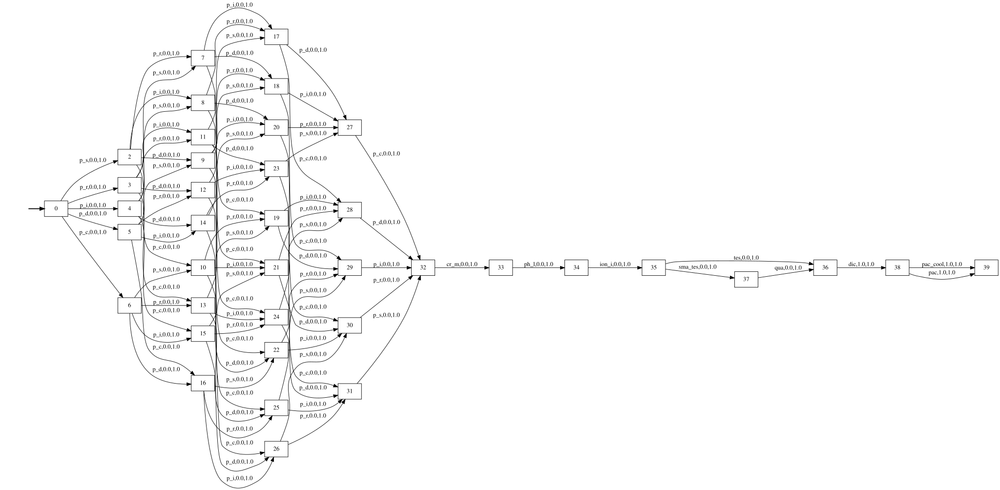

In [8]:
render_mdp_dfa(mdp_from_dfa(declare_automaton), no_sink=True)

In [9]:
mdp = comp_mdp(declare_automaton, all_services_ltlf, gamma=0.9)
print(len(mdp.all_states))

2905


In [10]:
render_comp_mdp(mdp)

In [11]:
opn = DPAnalytic(mdp, 1e-4)
opt_policy = opn.get_optimal_policy_vi()
opt_policy.policy_data.pop(0, None)

In [12]:
print_policy_data(opt_policy)

State=(('re', 're', 're', 're', 're', 're', 'av', 'av', 're', 'av', 'av', 're', 're', 're'), 0),	Action={('p_d', 0): 1.0}
State=(('re', 're', 're', 're', 're', 'br', 'br', 'br', 're', 'av', 'br', 'br', 're', 're'), 0),	Action={('p_d', 0): 1.0}
State=(('re', 're', 're', 're', 're', 'br', 'br', 'br', 're', 'br', 'av', 'br', 're', 're'), 0),	Action={('p_d', 0): 1.0}
State=(('re', 're', 're', 're', 're', 'br', 'av', 'br', 're', 'av', 'br', 're', 're', 're'), 0),	Action={('p_d', 0): 1.0}
State=(('re', 're', 're', 're', 're', 're', 'av', 'br', 're', 'br', 'br', 'br', 're', 're'), 0),	Action={('p_d', 0): 1.0}
State=(('re', 're', 're', 're', 're', 're', 'av', 'av', 're', 'br', 'av', 're', 're', 're'), 0),	Action={('p_d', 0): 1.0}
State=(('re', 're', 're', 're', 're', 're', 'br', 'br', 're', 'av', 'av', 'br', 're', 're'), 0),	Action={('p_d', 0): 1.0}
State=(('re', 're', 're', 're', 're', 're', 'av', 'br', 're', 'br', 'br', 're', 're', 're'), 0),	Action={('p_d', 0): 1.0}
State=(('re', 're', 're'

State=(('re', 're', 're', 're', 're', 're', 'av', 'av', 're', 'br', 'av', 'br', 're', 're'), 17),	Action={('p_d', 0): 1.0}
State=(('re', 're', 're', 're', 're', 're', 'av', 'av', 're', 'br', 'av', 'br', 're', 're'), 21),	Action={('p_d', 0): 1.0}
State=(('re', 're', 're', 're', 're', 're', 'av', 'av', 're', 'br', 'av', 'br', 're', 're'), 19),	Action={('p_d', 0): 1.0}
State=(('re', 're', 're', 're', 're', 're', 'av', 'av', 're', 'br', 'av', 'br', 're', 're'), 24),	Action={('p_d', 0): 1.0}
State=(('re', 're', 're', 're', 're', 'br', 'br', 'av', 're', 'av', 'av', 're', 're', 're'), 20),	Action={('p_r', 3): 1.0}
State=(('re', 're', 're', 're', 're', 'br', 'br', 'av', 're', 'av', 'av', 're', 're', 're'), 18),	Action={('p_i', 2): 1.0}
State=(('re', 're', 're', 're', 're', 'br', 'br', 'av', 're', 'av', 'av', 're', 're', 're'), 22),	Action={('p_i', 2): 1.0}
State=(('re', 're', 're', 're', 're', 'br', 'br', 'av', 're', 'av', 'av', 're', 're', 're'), 23),	Action={('p_s', 1): 1.0}
State=(('re', 'r

State=(('re', 're', 're', 're', 're', 're', 'do', 'do', 're', 'do', 'br', 'rep', 're', 're'), 36),	Action={('rep_dic', 11): 1.0}
State=(('re', 're', 're', 're', 're', 're', 'do', 'do', 're', 'br', 'do', 'rep', 're', 're'), 36),	Action={('rep_dic', 11): 1.0}
State=(('re', 're', 're', 're', 're', 're', 'do', 'br', 're', 'do', 'do', 'rep', 're', 're'), 36),	Action={('rep_dic', 11): 1.0}
State=(('re', 're', 're', 're', 're', 're', 'do', 'br', 're', 'do', 'br', 'rep', 're', 're'), 36),	Action={('rep_dic', 11): 1.0}
State=(('re', 're', 're', 're', 're', 're', 'do', 'br', 're', 'br', 'do', 'rep', 're', 're'), 36),	Action={('rep_dic', 11): 1.0}
State=(('re', 're', 're', 're', 're', 're', 'br', 'do', 're', 'do', 'do', 'rep', 're', 're'), 36),	Action={('rep_dic', 11): 1.0}
State=(('re', 're', 're', 're', 're', 're', 'br', 'do', 're', 'do', 'br', 'rep', 're', 're'), 36),	Action={('rep_dic', 11): 1.0}
State=(('re', 're', 're', 're', 're', 're', 'br', 'do', 're', 'br', 'do', 'rep', 're', 're'), 36)

## Automa debug

In [13]:
# no loop in the automa
def target_service_automata():
    '''Builds the target service automaton for the given dimension of the problem.'''
    # we need to distinguished the different dimensions because of the service setup (different services models for different dimensions)
    transition_function = {
        "s0": {PICK_DESIGN: ("s1", 1.0, 0), },
        "s1": {PICK_SILICON: ("s2", 1.0, 0), },
        "s2": {PICK_IMPURITIES: ("s3", 1.0, 0), },
        "s3": {PICK_RESIST: ("s4", 1.0, 0), },
        "s4": {PICK_CHEMICALS: ("s5", 1.0, 0), },

        "s5": {f"{MASK_CREATION}": ("s6", 1.0, 0), },
        "s6": {f"ch_{MASK_CREATION}": ("s7", 1.0, 0), },

        "s7": {PHOTOLITOGRAPHY: ("s8", 1.0, 0), },
        "s8": {f"ch_{PHOTOLITOGRAPHY}": ("s9", 1.0, 0), },

        "s9": {ION_IMPLANTATION: ("s10", 1.0, 0), },
        "s10": {f"ch_{ION_IMPLANTATION}": ("s11", 1.0, 0), },

        "s11": {
            SMART_TESTING: ("s12", 0.7, 0), 
            TESTING: ("s13", 0.3, 0),
        },
        "s12": {f"ch_{SMART_TESTING}": ("s14", 1.0, 0), },

        "s14": {QUALITY: ("s15", 1.0, 0), },
        "s15": {f"ch_{QUALITY}": ("s16", 1.0, 0), },
        
        "s13": {DICING: ("s17", 1.0, 0), },
        "s16": {f"{DICING}": ("s17", 1.0, 0), },
        
        "s17": {f"ch_{DICING}": ("s18", 1.0, 0), },

        "s18": {
            PACKAGING: ("s19", 0.6, 0), 
            PACKAGING_COOLING: ("s19", 0.4, 0),
        },
        "s19": {"no_op": ("s20", 1.0, 0), },
    }

    initial_state = "s0"
    final_states = {"s20"}

    return build_target_from_transitions(
        transition_function, initial_state, final_states
    )

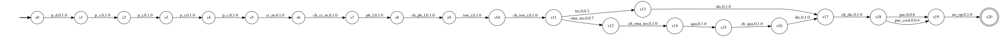

In [14]:
target = target_service_automata()
render_target(target)

In [15]:
gamma = 0.1
mdp = composition_mdp(target, *all_services_automa, gamma=gamma)

In [16]:
render_composition_mdp(mdp)

In [17]:
opn = DPAnalytic(mdp, 1e-4)
opt_policy = opn.get_optimal_policy_vi()
opt_policy.policy_data.pop(0, None)

{'initial': 1.0}

In [18]:
print_policy_data(opt_policy)

State=(('re', 're', 're', 're', 're', 'av', 'av', 'av', 're', 'av', 'av', 'av', 're', 're'), 's0', 'p_d'),	Action={0: 1.0}
State=(('re', 're', 're', 're', 're', 'av', 'av', 'av', 're', 'av', 'av', 'av', 're', 're'), 's1', 'p_s'),	Action={1: 1.0}
State=(('re', 're', 're', 're', 're', 'av', 'av', 'av', 're', 'av', 'av', 'av', 're', 're'), 's2', 'p_i'),	Action={2: 1.0}
State=(('re', 're', 're', 're', 're', 'av', 'av', 'av', 're', 'av', 'av', 'av', 're', 're'), 's3', 'p_r'),	Action={3: 1.0}
State=(('re', 're', 're', 're', 're', 'av', 'av', 'av', 're', 'av', 'av', 'av', 're', 're'), 's4', 'p_c'),	Action={4: 1.0}
State=(('re', 're', 're', 're', 're', 'av', 'av', 'av', 're', 'av', 'av', 'av', 're', 're'), 's5', 'cr_m'),	Action={5: 1.0}
State=(('re', 're', 're', 're', 're', 'do', 'av', 'av', 're', 'av', 'av', 'av', 're', 're'), 's6', 'ch_cr_m'),	Action={5: 1.0}
State=(('re', 're', 're', 're', 're', 'br', 'av', 'av', 're', 'av', 'av', 'av', 're', 're'), 's6', 'ch_cr_m'),	Action={5: 1.0}
State=(